In [ ]:
import numpy as np
import os
from PIL import Image
import matplotlib.pyplot as plt
import cv2
import tensorflow as tf
import pandas as pd
import matplotlib
from matplotlib.font_manager import fontManager
matplotlib.rc('font', family='Microsoft JhengHei')
import cv2
from tensorflow.keras.models import load_model

In [ ]:
# 讀取 A 和 beta 的參數，並將它們保存在字典中
def load_A_csv(csv_path):
    a_dict = {}
    df = pd.read_csv(csv_path)
    for index, row in df.iterrows():
        image_name = row['image_name']
        A = row['A']
        a_dict[image_name] = (A)
    return a_dict

# 示例使用
A_dict = load_A_csv(r'C:\Users\user\Desktop\Xiao\2024.08.17\generate hazy image\white\mix_white_landscape_A\A.csv')

In [3]:
A_dict['133387']

0.7897908473047393

In [ ]:
clean_folder = r"C:\Users\user\Desktop\Xiao\2024.08.17\generate hazy image\white\mix_white_landscape_A\image"
hazy_folder = r"C:\Users\user\Desktop\Xiao\2024.08.17\generate hazy image\white\mix_white_landscape_A\hazy_image"
depth_folder = r"C:\Users\user\Desktop\Xiao\2024.08.17\generate hazy image\white\mix_white_landscape_A\depth"

# 存儲圖像的列表
clean_images = []
hazy_images = []
depth_images = []
image_names = []

# 計數器
img_count = 0
max_images = 1207

# 遍歷hazy資料夾中的文件
for hazy_filename in os.listdir(hazy_folder):
    if hazy_filename.endswith('.png'):
        hazy_base_name = hazy_filename.split('-')[-1].replace('.png', '')
        
        # 遍歷depth資料夾中的文件
        for depth_filename in os.listdir(depth_folder):
            if depth_filename.endswith('.png') and depth_filename.split('-')[-1].replace('.png', '') == hazy_base_name:
                depth_image_path = os.path.join(depth_folder, depth_filename)

                # 遍歷clean資料夾中的文件
                for clean_filename in os.listdir(clean_folder):
                    if clean_filename.endswith('.png') and clean_filename.split('-')[-1].replace('.png', '') == hazy_base_name:
                        clean_image_path = os.path.join(clean_folder, clean_filename)

                        if os.path.exists(depth_image_path):
                            # 讀取hazy資料夾中的圖片並存入clean_images列表
                            hazy_image_path = os.path.join(hazy_folder, hazy_filename)
                            hazy_image = cv2.imread(hazy_image_path)
                            hazy_image = cv2.resize(hazy_image, (224, 224))
                            hazy_images.append(hazy_image)

                            # 讀取depth資料夾中的圖片並存入depth_images列表
                            depth_image = cv2.imread(depth_image_path)
                            depth_image = cv2.cvtColor(depth_image, cv2.COLOR_BGR2GRAY)
                            depth_image = cv2.resize(depth_image, (224, 224))
                            depth_images.append(depth_image)

                            # 讀取clean資料夾中的圖片並存入clean_images列表
                            clean_image = cv2.imread(clean_image_path)
                            clean_image = cv2.resize(clean_image, (224, 224))
                            clean_images.append(clean_image)

                            image_names.append(hazy_filename.replace('.png', ''))

                            # 更新計數器
                            img_count += 1
                            break

    if img_count >= max_images:
        break

Clean = np.array(clean_images)
Hazy = np.array(hazy_images)
Depth = np.array(depth_images)

print('Shape of Clean:',Clean.shape)
print('Shape of Hazy:',Hazy.shape)
print('Shape of Depth:',Depth.shape)

print(f"讀取了 {len(clean_images)} 張 Clean 圖片")
print(f"讀取了 {len(hazy_images)} 張 Hazy 圖片")
print(f"讀取了 {len(depth_images)} 張 Depth 圖片")

print("image_names的長度: ", len(image_names))


Shape of Clean: (1207, 224, 224, 3)
Shape of Hazy: (1207, 224, 224, 3)
Shape of Depth: (1207, 224, 224)
讀取了 1207 張 Clean 圖片
讀取了 1207 張 Hazy 圖片
讀取了 1207 張 Depth 圖片
image_names的長度:  1207


Clean len 1207
Hazy len 1207
Depth len 1207


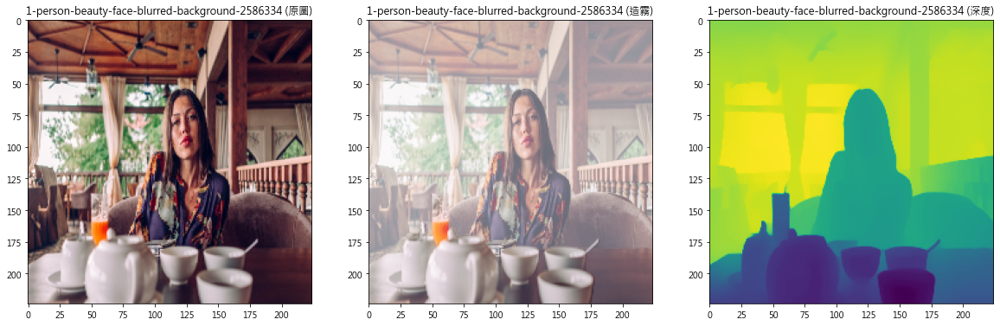

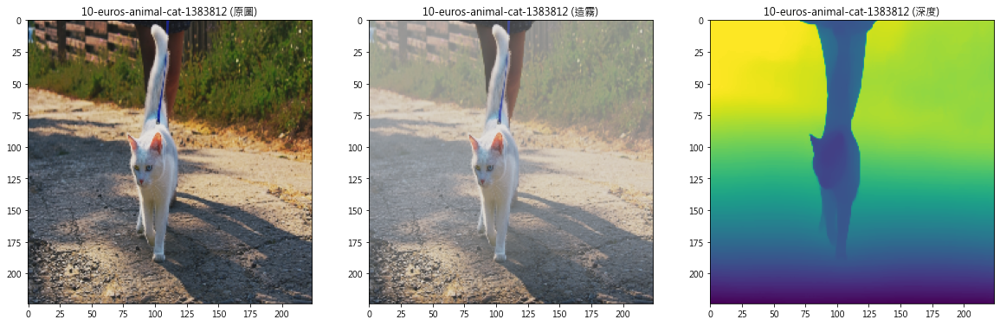

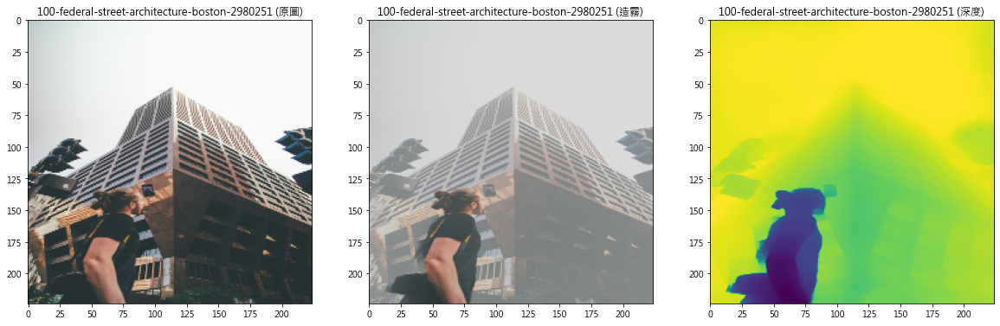

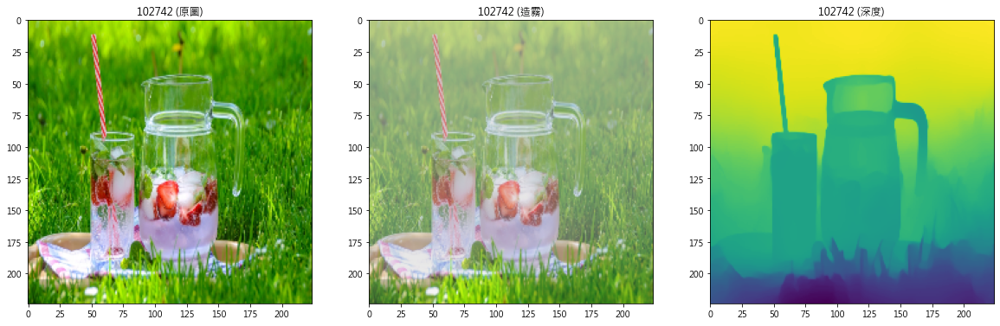

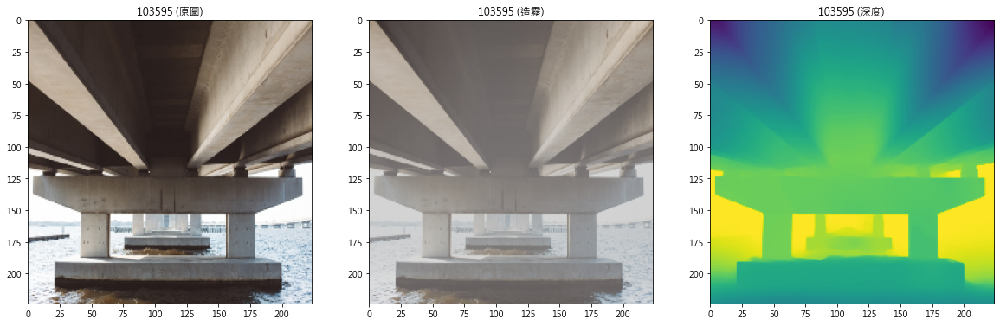

In [ ]:
print("Clean len", len(clean_images))
print("Hazy len", len(hazy_images))
print("Depth len", len(depth_images))

for i in range(5):
    plt.figure(figsize=(20, 13))
    plt.subplot(1, 3, 1)
    plt.title(f'{image_names[i]} (原圖)')
    plt.imshow(cv2.cvtColor(clean_images[i], cv2.COLOR_BGR2RGB))
    plt.subplot(1, 3, 2)
    plt.title(f'{image_names[i]} (造霧)')
    plt.imshow(cv2.cvtColor(hazy_images[i], cv2.COLOR_BGR2RGB))
    plt.subplot(1, 3, 3)
    plt.title(f'{image_names[i]} (深度)')
    plt.imshow(depth_images[i])
    plt.show()

In [6]:
Clean_norm = Clean / 255.0
Hazy_norm = Hazy / 255.0
Depth_norm = Depth / 255.0

In [7]:
from sklearn.model_selection import train_test_split
x_train_val, x_test, clean_train_val, clean_test, y_train_val, y_test, image_names_train_val, image_names_test = train_test_split(
                                                                                                                    Hazy_norm, 
                                                                                                                    Clean_norm, 
                                                                                                                    Depth_norm, 
                                                                                                                    image_names, 
                                                                                                                    test_size = 0.1, 
                                                                                                                    random_state = 11)

x_train, x_val, clean_train, clean_val, y_train, y_val, image_names_train, image_names_val = train_test_split(
                                                                                                x_train_val, 
                                                                                                clean_train_val, 
                                                                                                y_train_val, 
                                                                                                image_names_train_val, 
                                                                                                test_size=0.1, 
                                                                                                random_state=11)


print("x_train.shape         : ", x_train.shape)
print("clean_train.shape     : ", clean_train.shape)
print("y_train.shape         : ", y_train.shape)
print("image_names_train.len : ", len(image_names_train))
print("\n")

print("x_val.shape          : ", x_val.shape)
print("clean_val.shape      : ", clean_val.shape)
print("y_val.shape          : ", y_val.shape)
print("image_names_val.len  : ", len(image_names_val))
print("\n")

print("x_test.shape         : ", x_test.shape)
print("clean_test.shape     : ", clean_test.shape)
print("y_test.shape         : ", y_test.shape)
print("image_names_test.len : ", len(image_names_test))


x_train.shape         :  (977, 224, 224, 3)
clean_train.shape     :  (977, 224, 224, 3)
y_train.shape         :  (977, 224, 224)
image_names_train.len :  977


x_val.shape          :  (109, 224, 224, 3)
clean_val.shape      :  (109, 224, 224, 3)
y_val.shape          :  (109, 224, 224)
image_names_val.len  :  109


x_test.shape         :  (121, 224, 224, 3)
clean_test.shape     :  (121, 224, 224, 3)
y_test.shape         :  (121, 224, 224)
image_names_test.len :  121


In [8]:
from tensorflow import keras
import tensorflow as tf
from tensorflow.keras import Model
from tensorflow.keras import backend as K
from tensorflow.keras.layers import Input, Conv2D, Conv2DTranspose, Dropout, Concatenate, MaxPooling2D, BatchNormalization, Activation, Add

In [11]:
def build_model():
    inply = Input((x_train.shape[1], x_train.shape[2], x_train.shape[3],))

    conv1 = Conv2D(64, (3, 3), activation='relu', padding='same')(inply)
    conv1 = Conv2D(64, (3, 3), activation='relu', padding='same')(conv1)
    pool1 = MaxPooling2D((2, 2), strides=2, padding='same')(conv1)
    drop1 = Dropout(0.25)(pool1)

    conv2 = Conv2D(128, (3, 3), activation='relu', padding='same')(drop1)
    conv2 = Conv2D(128, (3, 3), activation='relu', padding='same')(conv2)
    pool2 = MaxPooling2D((2, 2), strides=2, padding='same')(conv2)
    drop2 = Dropout(0.25)(pool2)

    conv3 = Conv2D(256, (3, 3), activation='relu', padding='same')(drop2)
    conv3 = Conv2D(256, (3, 3), activation='relu', padding='same')(conv3)
    pool3 = MaxPooling2D((2, 2), strides=2, padding='same')(conv3)
    drop3 = Dropout(0.25)(pool3)

    conv4 = Conv2D(512, (3, 3), activation='relu', padding='same')(drop3)
    conv4 = Conv2D(512, (3, 3), activation='relu', padding='same')(conv4)
    pool4 = MaxPooling2D((2, 2), strides=2, padding='same')(conv4)
    drop4 = Dropout(0.25)(pool4)

    convm = Conv2D(1024, (3, 3), activation='relu', padding='same')(drop4)
    convm = Conv2D(1024, (3, 3), activation='relu', padding='same')(convm)

    tran5 = Conv2DTranspose(512, (2, 2), strides=2, padding='valid', activation='relu')(convm)
    conc5 = Concatenate()([tran5, conv4])
    conv5 = Conv2D(512, (3, 3), activation='relu', padding='same')(conc5)
    conv5 = Conv2D(512, (3, 3), activation='relu', padding='same')(conv5)
    drop5 = Dropout(0.25)(conv5)

    tran6 = Conv2DTranspose(256, (2, 2), strides=2, padding='valid', activation='relu')(drop5)
    conc6 = Concatenate()([tran6, conv3])
    conv6 = Conv2D(256, (3, 3), activation='relu', padding='same')(conc6)
    conv6 = Conv2D(256, (3, 3), activation='relu', padding='same')(conv6)
    drop6 = Dropout(0.25)(conv6)

    tran7 = Conv2DTranspose(128, (2, 2), strides=2, padding='valid', activation='relu')(drop6)
    conc7 = Concatenate()([tran7, conv2])
    conv7 = Conv2D(128, (3, 3), activation='relu', padding='same')(conc7)
    conv7 = Conv2D(128, (3, 3), activation='relu', padding='same')(conv7)
    drop7 = Dropout(0.25)(conv7)

    tran8 = Conv2DTranspose(64, (2, 2), strides=2, padding='valid', activation='relu')(drop7)
    conc8 = Concatenate()([tran8, conv1])
    conv8 = Conv2D(64, (3, 3), activation='relu', padding='same')(conc8)
    conv8 = Conv2D(64, (3, 3), activation='relu', padding='same')(conv8)
    conv8 = BatchNormalization(axis=3)(conv8)
    conv8 = Activation('relu')(conv8)
    drop8 = Dropout(0.25)(conv8)

    outly = Conv2D(1, (1, 1), activation='relu', padding='same')(drop8)
    model = Model(inputs=inply, outputs=outly, name='U-Net')
    return model

model = build_model()
model.summary()


Model: "U-Net"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            [(None, 224, 224, 3) 0                                            
__________________________________________________________________________________________________
conv2d (Conv2D)                 (None, 224, 224, 64) 1792        input_1[0][0]                    
__________________________________________________________________________________________________
conv2d_1 (Conv2D)               (None, 224, 224, 64) 36928       conv2d[0][0]                     
__________________________________________________________________________________________________
max_pooling2d (MaxPooling2D)    (None, 112, 112, 64) 0           conv2d_1[0][0]                   
______________________________________________________________________________________________

In [12]:
# from keras.utils import plot_model
# plot_model(model, show_shapes=True, show_layer_names=True)

In [16]:
x_train = x_train
print(x_train.shape)
print(x_train.dtype)

(977, 224, 224, 3)
float64


In [17]:
print(y_train.dtype)
print(y_train.shape)

float64
(977, 224, 224)


In [18]:
y_train = np.expand_dims(y_train, axis=-1)
y_train.shape

(977, 224, 224, 1)

In [19]:
print(y_val.dtype)
print(y_val.shape)

float64
(109, 224, 224)


In [20]:
y_val = np.expand_dims(y_val, axis=-1)
y_val.shape

(109, 224, 224, 1)

In [21]:
def get_A_from_filename(image_name, a_dict):
    # 如果檔名在字典中，則返回對應的 A
    if image_name in a_dict:
        A = a_dict[image_name]
        return A
    else:
        raise ValueError(f"Image name {image_name} not found in A-beta dictionary.")

In [22]:
image_name = '5606'
try:
    A_value = get_A_from_filename(image_name, A_dict)
    print(f"The A value for {image_name} is {A_value}")
except ValueError as e:
    print(e)

The A value for 5606 is 0.9401869905752716


In [ ]:
import itertools
from tensorflow.keras.preprocessing.image import ImageDataGenerator

# 創建數據生成器對象
data_gen_args = dict(
    horizontal_flip=True   # 隨機水平翻轉
    # vertical_flip=True     # 隨機上下翻轉
)

def custom_generator(clean_gen, hazy_gen, depth_gen, image_names):
    # 使用 itertools.cycle 來循環檔名列表
    image_name_cycle = itertools.cycle(image_names)  # 讓檔名循環使用

    while True:
        # 生成增強影像
        clean_batch = next(clean_gen)
        hazy_batch = next(hazy_gen)
        depth_batch = next(depth_gen)

        # 確保批次大小一致
        batch_size = clean_batch.shape[0]
        assert batch_size == hazy_batch.shape[0] == depth_batch.shape[0]

        # 從 image_name_cycle 生成批次大小數量的檔名
        batch_image_names = [next(image_name_cycle) for _ in range(batch_size)]
        batch_A_values = [get_A_from_filename(name, A_dict) for name in batch_image_names]

        yield clean_batch, hazy_batch, depth_batch, batch_image_names, batch_A_values

clean_datagen = ImageDataGenerator(**data_gen_args)
hazy_datagen = ImageDataGenerator(**data_gen_args)
depth_datagen = ImageDataGenerator(**data_gen_args)

# 設置數據生成器
seed = 1
clean_generator = clean_datagen.flow(clean_train, batch_size=32, shuffle=False, seed=seed)
hazy_generator = hazy_datagen.flow(x_train, batch_size=32, shuffle=False, seed=seed)
depth_generator = depth_datagen.flow(y_train, batch_size=32, shuffle=False, seed=seed)

# 自定義生成器
train_generator = custom_generator(clean_generator, hazy_generator, depth_generator, np.array(image_names_train))

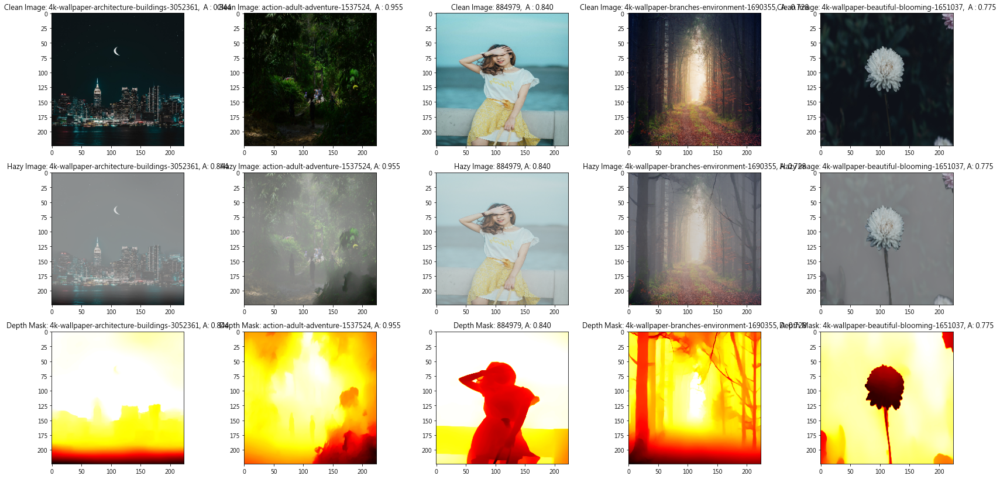

In [24]:
num_images_to_show = 5

for (clean_batch, hazy_batch, depth_batch, batch_image_names, batch_A_values) in train_generator:
    plt.figure(figsize=(23, 15))

    for i in range(num_images_to_show):
        plt.subplot(4, num_images_to_show, i + 1)
        plt.imshow(cv2.cvtColor(clean_batch[i], cv2.COLOR_BGR2RGB))
        # plt.title("Clean Image: {}".format(batch_image_names[i]))
        plt.title(f"Clean Image: {batch_image_names[i]},  A : {batch_A_values[i]:.3f}")

        plt.subplot(4, num_images_to_show, num_images_to_show + i + 1)
        plt.imshow(cv2.cvtColor(hazy_batch[i], cv2.COLOR_BGR2RGB))
        # plt.title("Hazy Image: {}".format(batch_image_names[i]))
        plt.title(f"Hazy Image: {batch_image_names[i]}, A: {batch_A_values[i]:.3f}")

        plt.subplot(4, num_images_to_show, 2*num_images_to_show + i + 1)
        plt.imshow(depth_batch[i], cmap='hot')
        # plt.title("Depth Mask: {}".format(batch_image_names[i]))
        plt.title(f"Depth Mask: {batch_image_names[i]}, A: {batch_A_values[i]:.3f}")

    plt.tight_layout()
    plt.show()

    break  # 只展示一批數據

In [ ]:
# 自定義損失函數，通過閉包傳入 J, A, beta
def custom_loss(J, A, hazy_batch):
    def loss(y_true, y_pred):
        A_tensor = tf.convert_to_tensor(A, dtype=tf.float32)
        mse_depth = tf.reduce_mean(tf.square(y_true - y_pred))
        t_pred = tf.exp((-1) * y_pred)

        if len(A_tensor.shape) == 1:
            A_tensor = tf.reshape(A_tensor, [-1, 1, 1, 1])

        I_pred = J * t_pred + A_tensor * (1 - t_pred)
        mse_hazy = tf.reduce_mean(tf.square(I_pred - hazy_batch))  # 假設 y_true 是 hazy_image

        loss_value = mse_depth + 0.5 * mse_hazy
        return loss_value
    return loss

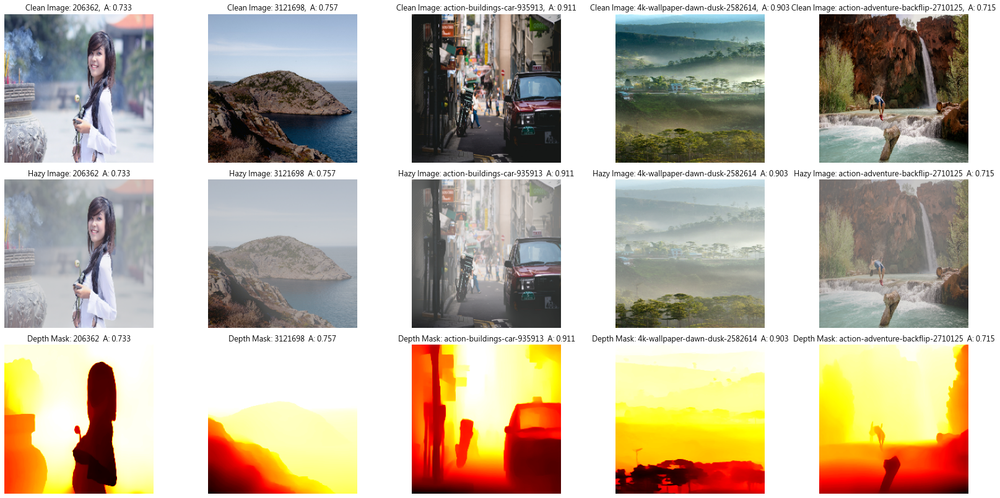

In [31]:
import matplotlib.pyplot as plt
import cv2

# 設置顯示的圖片數量
num_images_to_show = 5

val_A_values = [get_A_from_filename(name, A_dict) for name in image_names_val]

# 從驗證集挑選前 num_images_to_show 張圖片進行顯示
plt.figure(figsize=(23, 15))
for i in range(num_images_to_show):
    # 顯示 Clean 圖片（第一行）
    plt.subplot(4, num_images_to_show, i + 1)
    plt.imshow(cv2.cvtColor(clean_val[i].astype(np.float32), cv2.COLOR_BGR2RGB))
    plt.title(f"Clean Image: {image_names_val[i]},  A: {val_A_values[i]:.3f}")
    plt.axis('off')

    # 顯示 Hazy 圖片（第二行）
    plt.subplot(4, num_images_to_show, num_images_to_show + i + 1)
    plt.imshow(cv2.cvtColor(x_val[i].astype(np.float32), cv2.COLOR_BGR2RGB))
    plt.title(f"Hazy Image: {image_names_val[i]}  A: {val_A_values[i]:.3f}")
    plt.axis('off')

    # 顯示 Depth 圖片（第三行）
    plt.subplot(4, num_images_to_show, 2 * num_images_to_show + i + 1)
    plt.imshow(y_val[i, :, :, 0], cmap="hot")
    plt.title(f"Depth Mask: {image_names_val[i]}  A: {val_A_values[i]:.3f}")
    plt.axis('off')

plt.tight_layout()
plt.show()


In [ ]:
# 自定義訓練循環
epochs = 500
batch_size = 32
steps_per_epoch = len(x_train) // batch_size

epoch_losses = []
validation_losses = []  # 用於儲存每個 epoch 的驗證損失
val_batch_size = 16


# 構建模型
model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=0.0001), 
                loss=lambda y_true, y_pred: tf.constant(0.0, dtype=tf.float32))  # 不需要在這裡指定損失函數


for epoch in range(epochs):
    # print(f"Epoch {epoch + 1}/{epochs}")
    epoch_loss = 0

    # 從 train_generator 中獲取一批數據
    for step, (clean_batch, hazy_batch, depth_batch, batch_image_names, batch_A_values) in enumerate(train_generator):
        if step >= steps_per_epoch:
            break  # 每個 epoch 只執行 steps_per_epoch 次
        
        with tf.GradientTape() as tape:
            # 前向傳播
            depth_pred = model(hazy_batch, training=True)
            # 計算自定義損失
            current_loss = custom_loss(clean_batch, batch_A_values, hazy_batch)(depth_batch, depth_pred)  # 假設 beta 固定為 1.0

        # 計算梯度並應用
        gradients = tape.gradient(current_loss, model.trainable_variables)
        model.optimizer.apply_gradients(zip(gradients, model.trainable_variables))
        # 累加損失
        epoch_loss += current_loss

    # 計算每個 epoch 的平均損失
    epoch_loss_avg = epoch_loss / steps_per_epoch
    # 將每個 epoch 的損失存儲起來
    epoch_losses.append(epoch_loss_avg.numpy())

    # 分批次計算驗證損失
    val_loss_total = 0.0
    val_steps = 0

    for i in range(0, len(x_val), val_batch_size):
        # 分批次取出驗證集資料
        x_val_batch = x_val[i:i + val_batch_size]
        y_val_batch = y_val[i:i + val_batch_size]
        clean_val_batch = clean_val[i:i + val_batch_size]
        val_A_batch = val_A_values[i:i + val_batch_size]

        # 預測驗證批次
        val_depth_pred_batch = model(x_val_batch, training=False)

        # 計算當前批次的驗證損失
        val_loss_batch = custom_loss(clean_val_batch, val_A_batch, x_val_batch)(y_val_batch, val_depth_pred_batch)
        val_loss_total += tf.reduce_mean(val_loss_batch)  # 累加每個批次的平均損失
        val_steps += 1

    # 計算驗證集的平均損失
    val_loss_avg = val_loss_total / val_steps
    validation_losses.append(val_loss_avg.numpy())

    print(f"Epoch {epoch + 1} training Loss: {epoch_loss_avg.numpy()}", f", Val Loss: {val_loss_avg.numpy()}")


If you intended to run this layer in float32, you can safely ignore this warning. If in doubt, this warning is likely only an issue if you are porting a TensorFlow 1.X model to TensorFlow 2.

To change all layers to have dtype float64 by default, call `tf.keras.backend.set_floatx('float64')`. To change just this layer, pass dtype='float64' to the layer constructor. If you are the author of this layer, you can disable autocasting by passing autocast=False to the base Layer constructor.

Epoch 1 training Loss: 0.3448576331138611 , Val Loss: 0.5270764231681824
Epoch 2 training Loss: 0.12579721212387085 , Val Loss: 0.505974531173706
Epoch 3 training Loss: 0.08637510985136032 , Val Loss: 0.512004017829895
Epoch 4 training Loss: 0.06919870525598526 , Val Loss: 0.49543237686157227
Epoch 5 training Loss: 0.06204559653997421 , Val Loss: 0.48095226287841797
Epoch 6 training Loss: 0.05613548308610916 , Val Loss: 0.4706145226955414
Epoch 7 training Loss: 0.05300125107169151 , Val Loss: 0.46388560

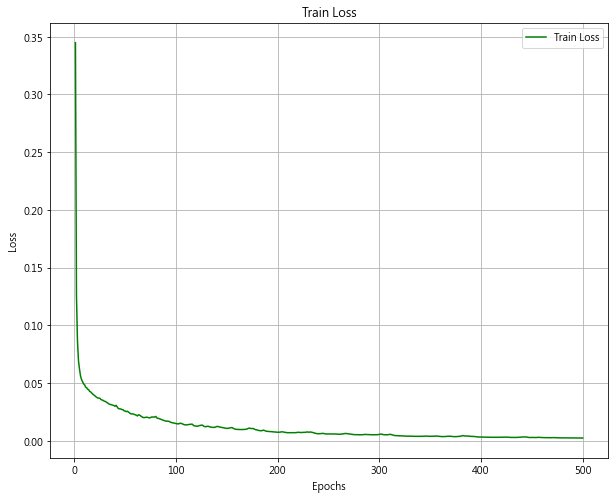

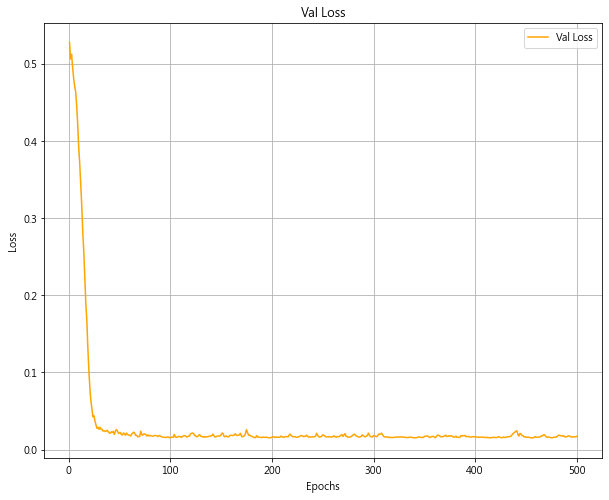

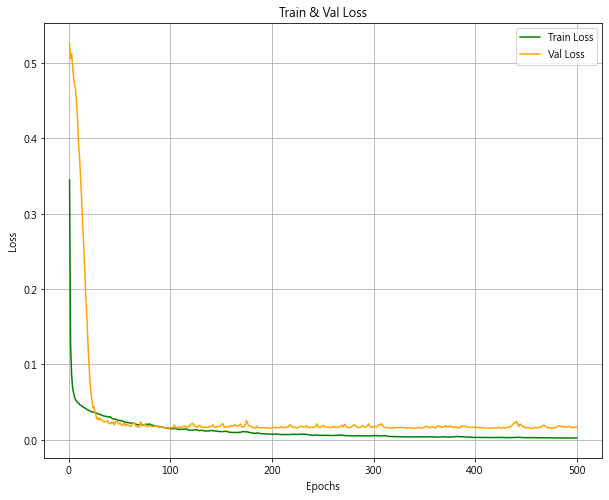

In [33]:
plt.figure(figsize=(10, 8))
plt.plot(range(1, epochs + 1), epoch_losses, label="Train Loss", color="green")
plt.xlabel("Epochs")
plt.ylabel("Loss")
plt.title("Train Loss")
plt.legend()
plt.grid(True)
plt.show()

plt.figure(figsize=(10, 8))
plt.plot(range(1, epochs + 1), validation_losses, label="Val Loss", color="orange")
plt.xlabel("Epochs")
plt.ylabel("Loss")
plt.title("Val Loss")
plt.legend()
plt.grid(True)
plt.show()

plt.figure(figsize=(10, 8))
plt.plot(range(1, epochs + 1), epoch_losses, label="Train Loss", color="green")
plt.plot(range(1, epochs + 1), validation_losses, label="Val Loss", color="orange")
plt.xlabel("Epochs")
plt.ylabel("Loss")
plt.title("Train & Val Loss")
plt.legend()
plt.grid(True)
plt.show()

In [ ]:
# 保存整個模型
model.save('model+weights.h5')

# 保存模型架構
model_json = model.to_json()
with open('model_nice_data.json', 'w') as json_file:
    json_file.write(model_json)

# 保存模型權重
model.save_weights('nice_data_weights.h5')

看test

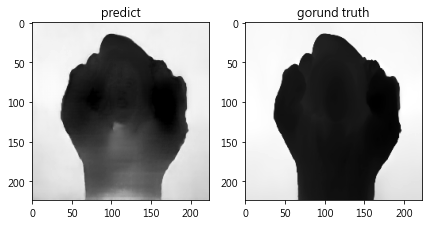

In [39]:
pred = model.predict(x_test)

i=1
plt.figure(figsize=(7, 7))
plt.subplot(1, 2, 1)
plt.title("predict")
plt.imshow(pred[i],cmap= "gray")
plt.subplot(1, 2, 2)
plt.title("gorund truth")
plt.imshow(y_test[i],cmap= "gray")

In [40]:
y_test.shape

(121, 224, 224)

In [41]:
pred.shape

(121, 224, 224, 1)

看train

In [42]:
check_x_train = model.predict(x_train)

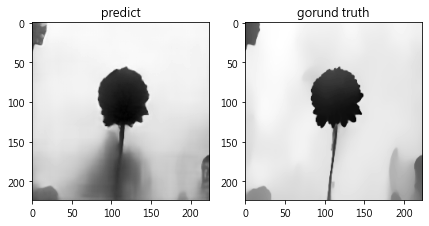

In [43]:
i=4
plt.figure(figsize=(7, 7))
plt.subplot(1, 2, 1)
plt.title("predict")
plt.imshow(check_x_train[i],cmap= "gray")
plt.subplot(1, 2, 2)
plt.title("gorund truth")
plt.imshow(y_train[i],cmap= "gray")

查看多張train set

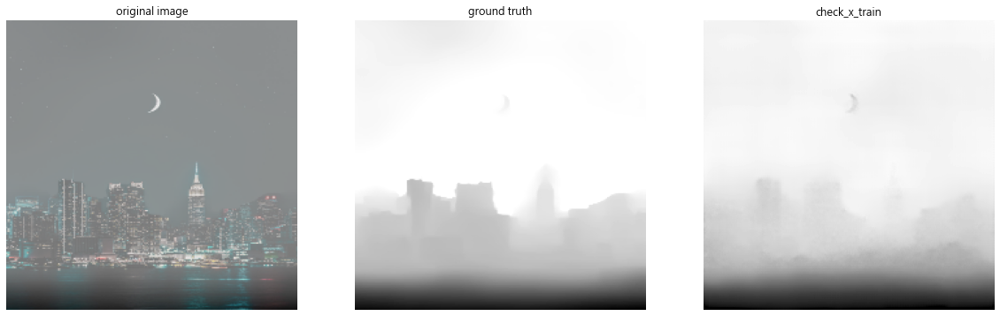

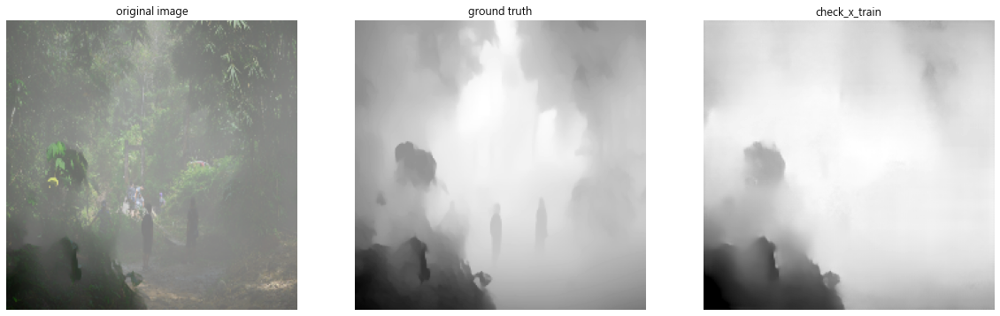

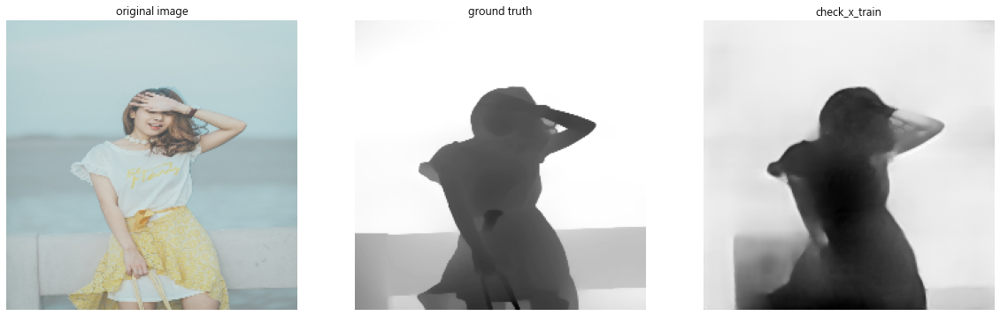

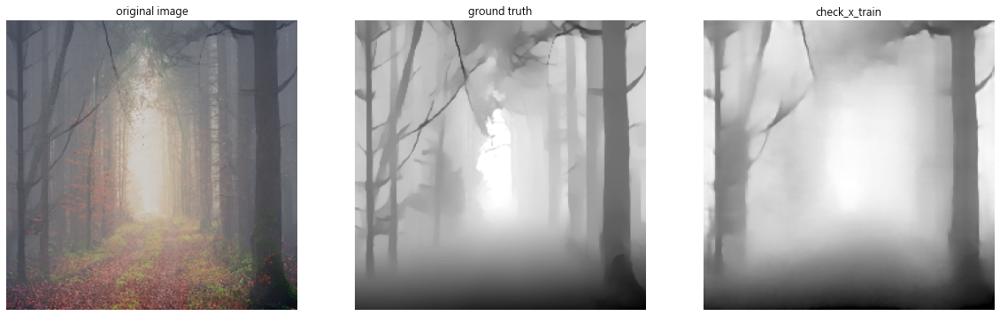

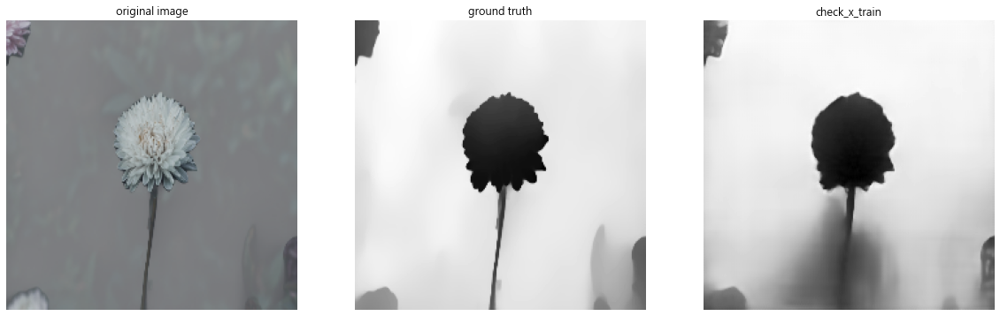

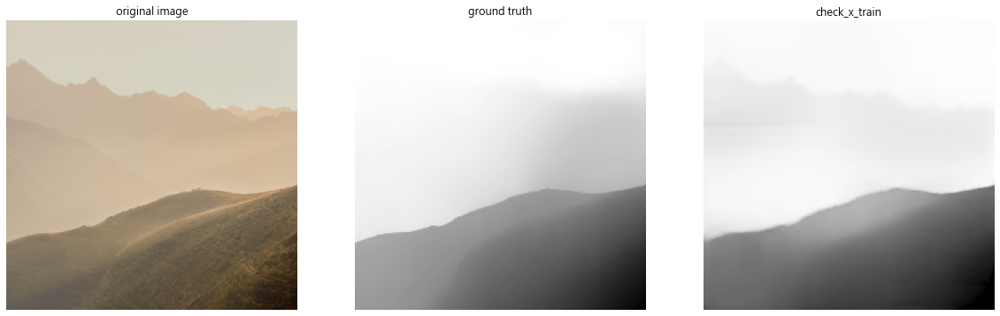

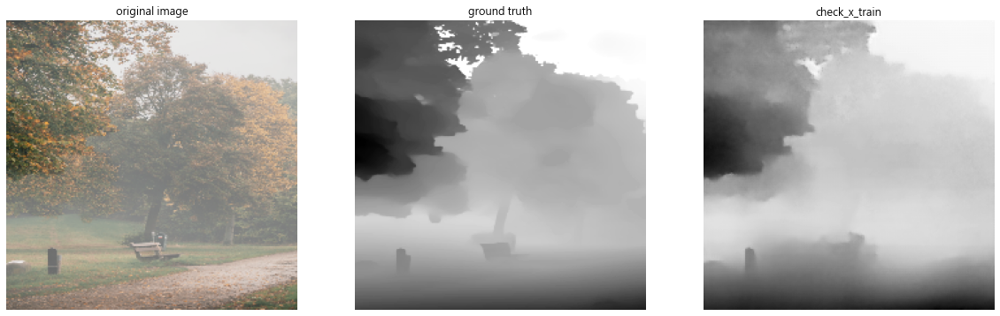

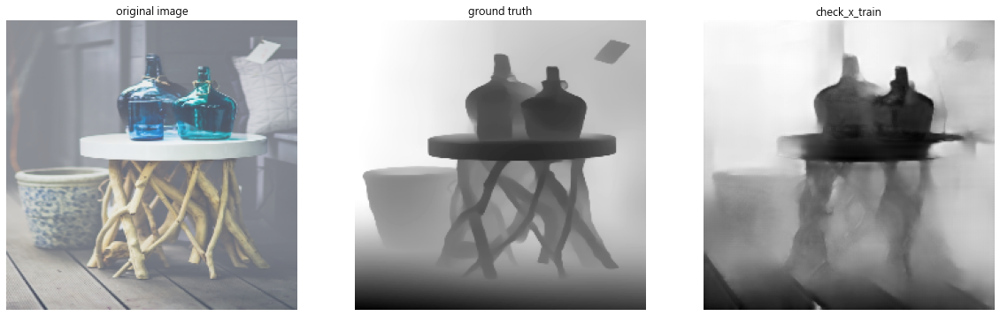

In [ ]:
x_train_32 = x_train.astype(np.float32) # 64位浮點opencv只適用float32

# for i in range(x_train.shape[0]):
for i in range(8):
  plt.figure(figsize=(20, 14))
  plt.subplot(2, 3, 1)
  plt.title("original image")
  plt.imshow(cv2.cvtColor(x_train_32[i], cv2.COLOR_BGR2RGB))
  plt.axis("off")
  plt.subplot(2, 3, 2)
  plt.title("ground truth")
  plt.imshow(y_train[i], cmap='gray')
  plt.axis("off")
  plt.subplot(2, 3, 3)
  plt.title("check_x_train")
  plt.imshow(check_x_train[i], cmap='gray')
  plt.axis("off")
  plt.show()

看多張val set

In [ ]:
check_x_val = model.predict(x_val)

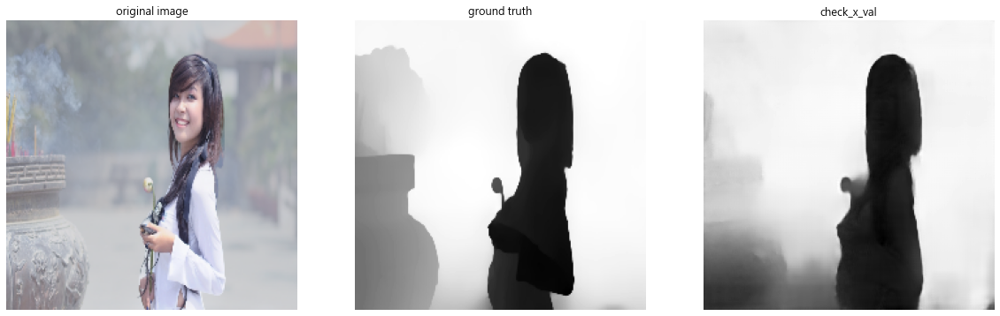

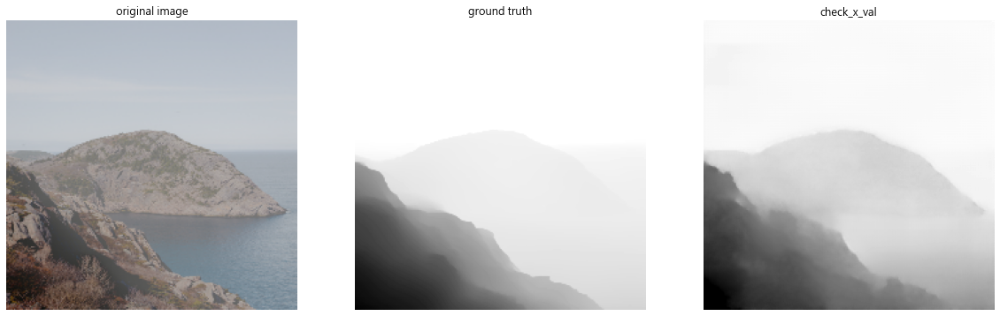

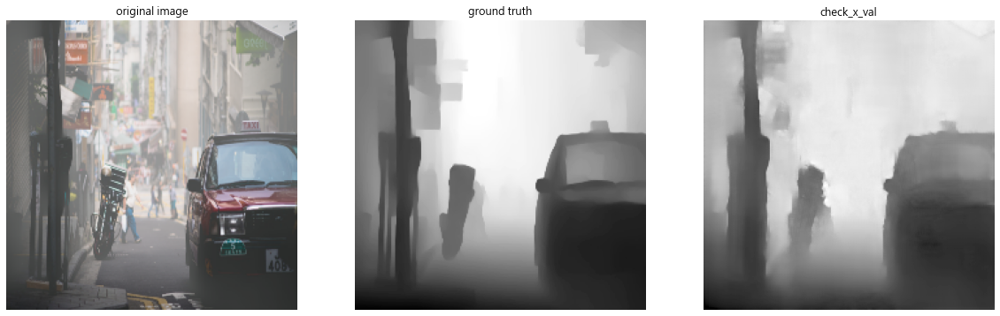

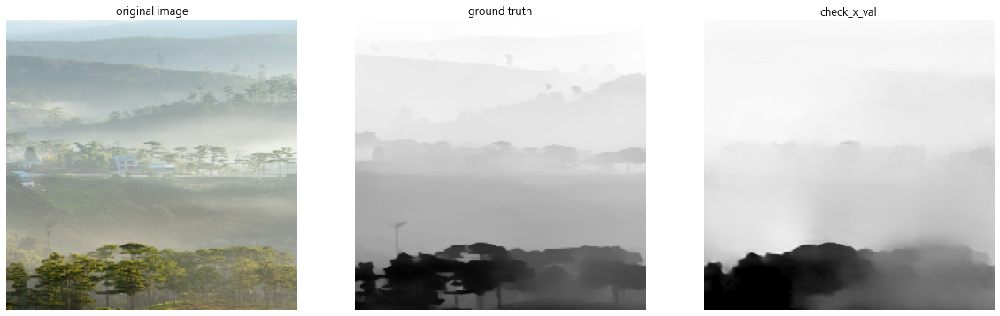

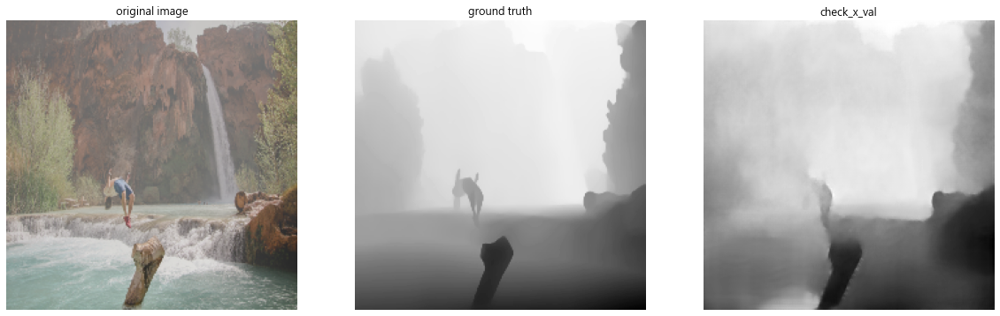

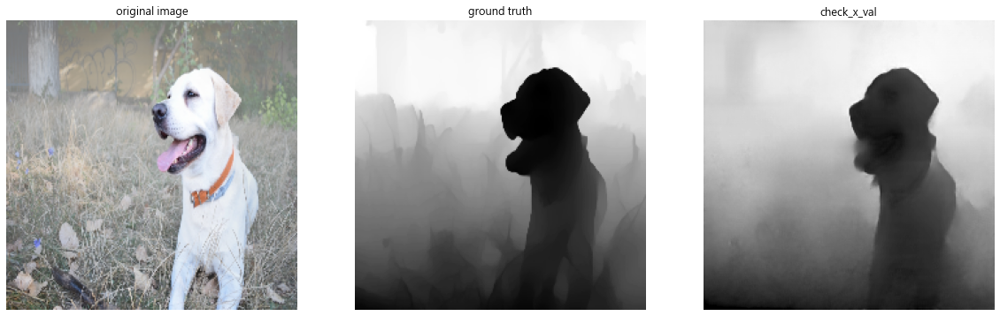

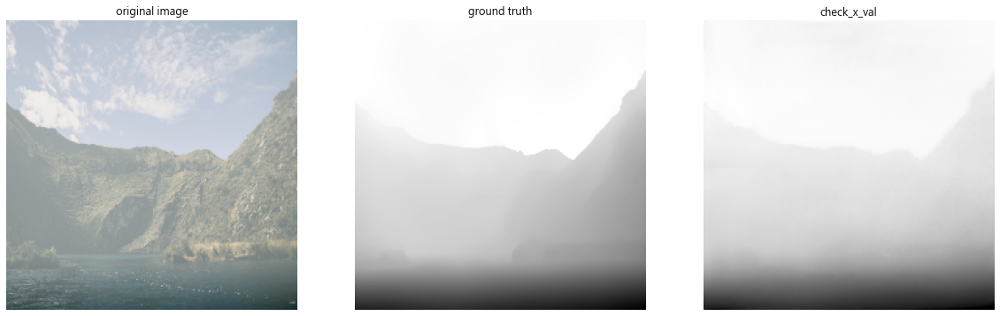

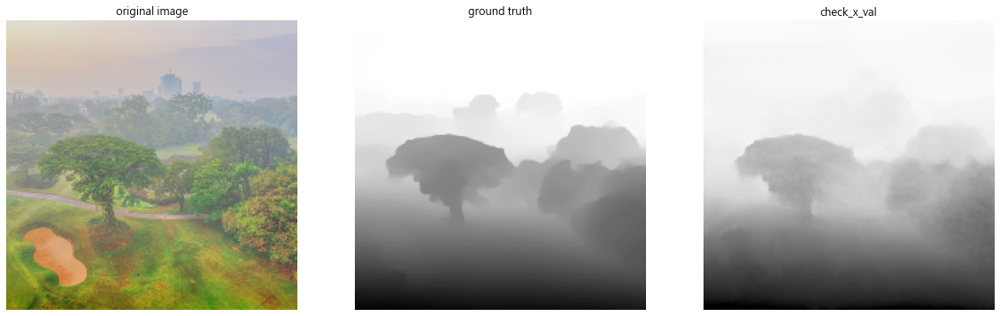

In [ ]:
x_val_32 = x_val.astype(np.float32) # 64位浮點opencv只適用float32

# for i in range(x_val.shape[0]):
for i in range(8):
  plt.figure(figsize=(20, 14))
  plt.subplot(2, 3, 1)
  plt.title("original image")
  plt.imshow(cv2.cvtColor(x_val_32[i], cv2.COLOR_BGR2RGB))
  plt.axis("off")
  plt.subplot(2, 3, 2)
  plt.title("ground truth")
  plt.imshow(y_val[i], cmap='gray')
  plt.axis("off")
  plt.subplot(2, 3, 3)
  plt.title("check_x_val")
  plt.imshow(check_x_val[i], cmap='gray')
  plt.axis("off")
  plt.show()

看多張test set

In [47]:
check_x_test = model.predict(x_test)

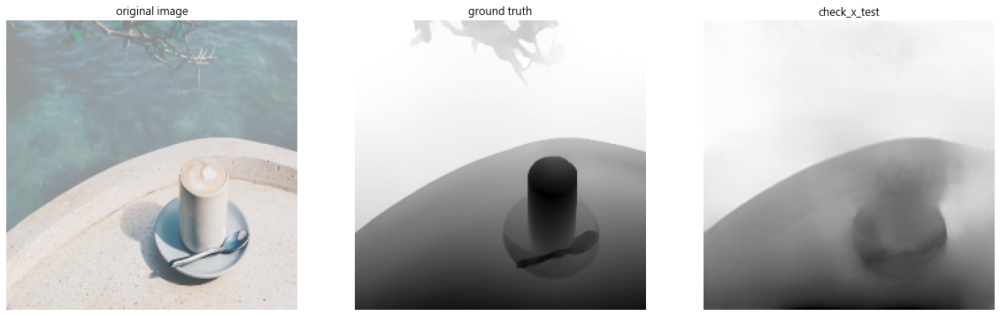

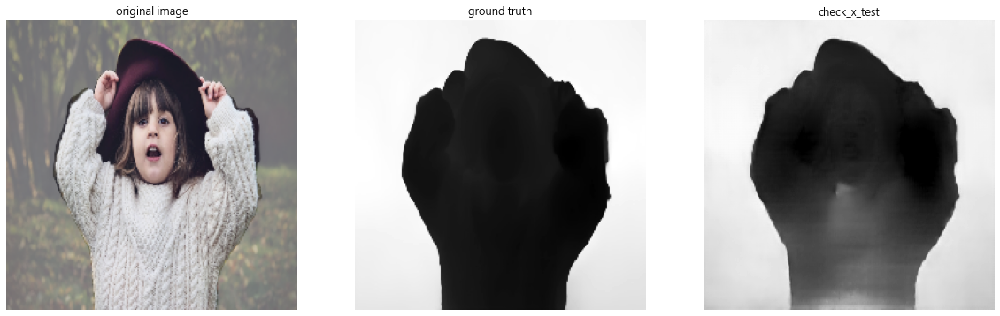

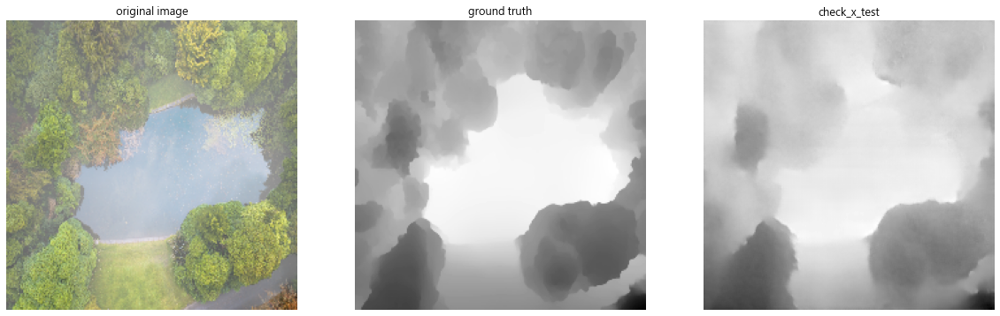

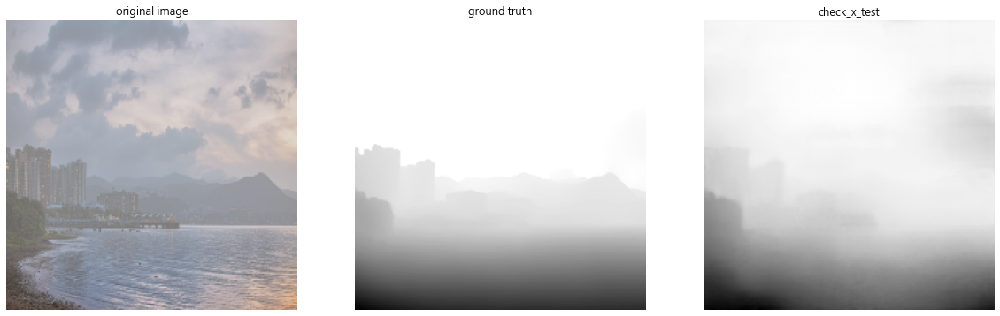

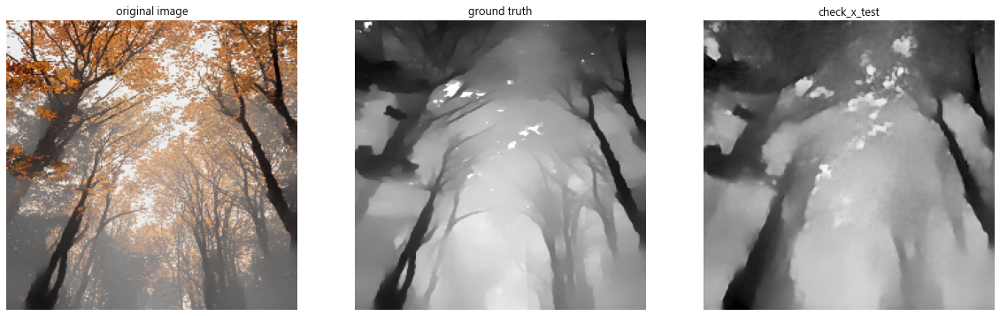

...

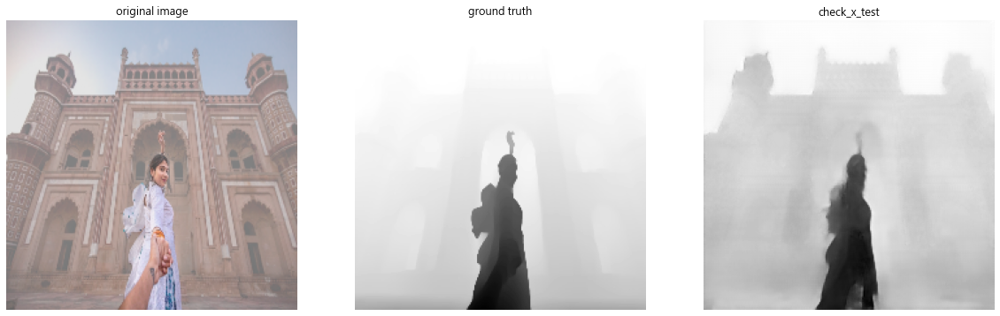

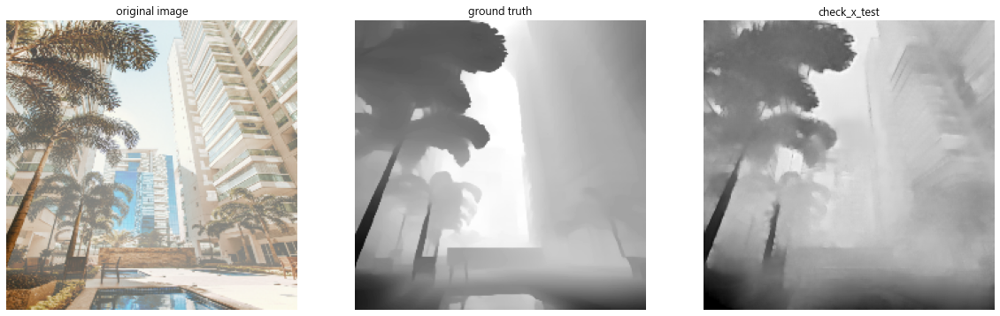

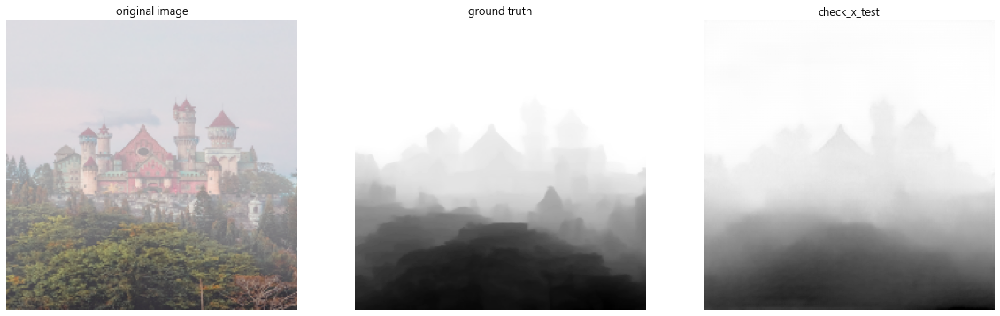

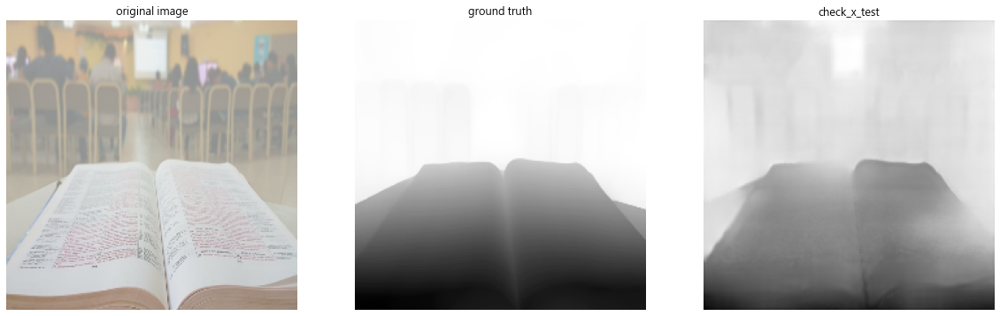

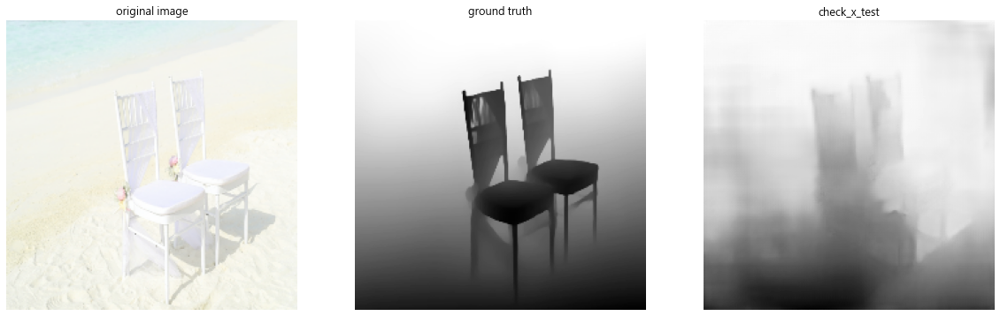

In [48]:
x_test_32 = x_test.astype(np.float32) # 64位浮點opencv只適用float32

# for i in range(x_val.shape[0]):
for i in range(30):
  plt.figure(figsize=(20, 14))
  plt.subplot(2, 3, 1)
  plt.title("original image")
  plt.imshow(cv2.cvtColor(x_test_32[i], cv2.COLOR_BGR2RGB))
  plt.axis("off")
  plt.subplot(2, 3, 2)
  plt.title("ground truth")
  plt.imshow(y_test[i], cmap='gray')
  plt.axis("off")
  plt.subplot(2, 3, 3)
  plt.title("check_x_test")
  plt.imshow(check_x_test[i], cmap='gray')
  plt.axis("off")
  plt.show()
